In [ ]:
!pip install pyod


In [ ]:
!pip install ppscore


In [ ]:
!pip install LIME

In [ ]:
# Importing Libraries

## Data manipulation
import numpy as np
import pandas as pd

## Data visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

## Sklearn functions
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, cross_val_score, train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import accuracy_score, balanced_accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, RobustScaler, PowerTransformer
from sklearn.ensemble import RandomForestClassifier

## Imblearn
from imblearn.pipeline import Pipeline as imbpipeline
from imblearn.over_sampling import SMOTE, RandomOverSampler, KMeansSMOTE, ADASYN, BorderlineSMOTE
from imblearn.combine import SMOTEENN, SMOTETomek

## Predictive power score
import ppscore as pps

## PYOD
from pyod.models.ecod import ECOD

## Scipy functions
from scipy.stats import randint

## XGBoost models
from xgboost import XGBClassifier

## LIME
import lime
import lime.lime_tabular
from __future__ import print_function

np.random.seed(1)

In [ ]:
# Defining functions

## Oversampler
def oversample_data(sampler,X,y):
    return(sampler.fit_resample(X, y))

# Calculation of performance metrics
def perf_metrics(y_true, y_pred_binary):
    # Calculate metrics
    accuracy = accuracy_score(y_true, y_pred_binary)
    balanced_accuracy = balanced_accuracy_score(y_true, y_pred_binary)
    precision = precision_score(y_true, y_pred_binary,average='binary')
    recall = recall_score(y_true, y_pred_binary,average='binary')
    f1 = f1_score(y_true, y_pred_binary,average='binary')

    # Create dictionary to store metrics
    metrics_dict = {
        'accuracy': round(accuracy*100,2),
        'balanced_accuracy' : round(balanced_accuracy*100,2),
        'precision': round(precision*100,2),
        'recall': round(recall*100,2),
        'f1_score': round(f1*100,2)
    }

    return metrics_dict

In [ ]:
company_df = pd.read_csv("/content/Bankruptcies.csv")
company_df = company_df.rename(columns=lambda x: x.strip())

In [ ]:
company_df.head()


,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,...,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,...,0.795297,0.008323,0.623652,0.610237,0.839969,0.283846,0.264577,0.570175,1,0.020794
2,1,0.426071,0.499019,0.472295,0.601450,0.601364,0.998857,0.796403,0.808388,0.302035,...,0.774670,0.040003,0.623841,0.601449,0.836774,0.290189,0.026555,0.563706,1,0.016474
3,1,0.399844,0.451265,0.457733,0.583541,0.583541,0.998700,0.796967,0.808966,0.303350,...,0.739555,0.003252,0.622929,0.583538,0.834697,0.281721,0.026697,0.564663,1,0.023982
4,1,0.465022,0.538432,0.522298,0.598783,0.598783,0.998973,0.797366,0.809304,0.303475,...,0.795016,0.003878,0.623521,0.598782,0.839973,0.278514,0.024752,0.575617,1,0.035490


In [ ]:
company_df.rename(columns={'Bankrupt?': 'Bankrupt'},inplace = True)


In [ ]:
# Dimension
print("\nData dimension :")
print("Number of Records : ",company_df.shape[0],"\nNumber of Features : ",company_df.shape[1])

# Datatype of columns
print("\nDatatype of Features :")
print(company_df.dtypes.value_counts())

# Missing values
print("\nMissing values :")
na_value_check = company_df.isna().sum()
if len(na_value_check[na_value_check > 0]) == 0 :
    print("Missing values not identified")
else :
    print(na_value_check[na_value_check > 0])

# Duplicated records check
print("\nDuplicated records :")
duplicate_rows = company_df.duplicated()
if len(company_df[duplicate_rows]) == 0:
    print("Duplicated records not identified")
else :
    print("Number of duplicated records :",len(company_df[duplicate_rows]))


Data dimension :
Number of Records :  6819 
Number of Features :  96

Datatype of Features :
float64    93
int64       3
dtype: int64

Missing values :
Missing values not identified

Duplicated records :
Duplicated records not identified


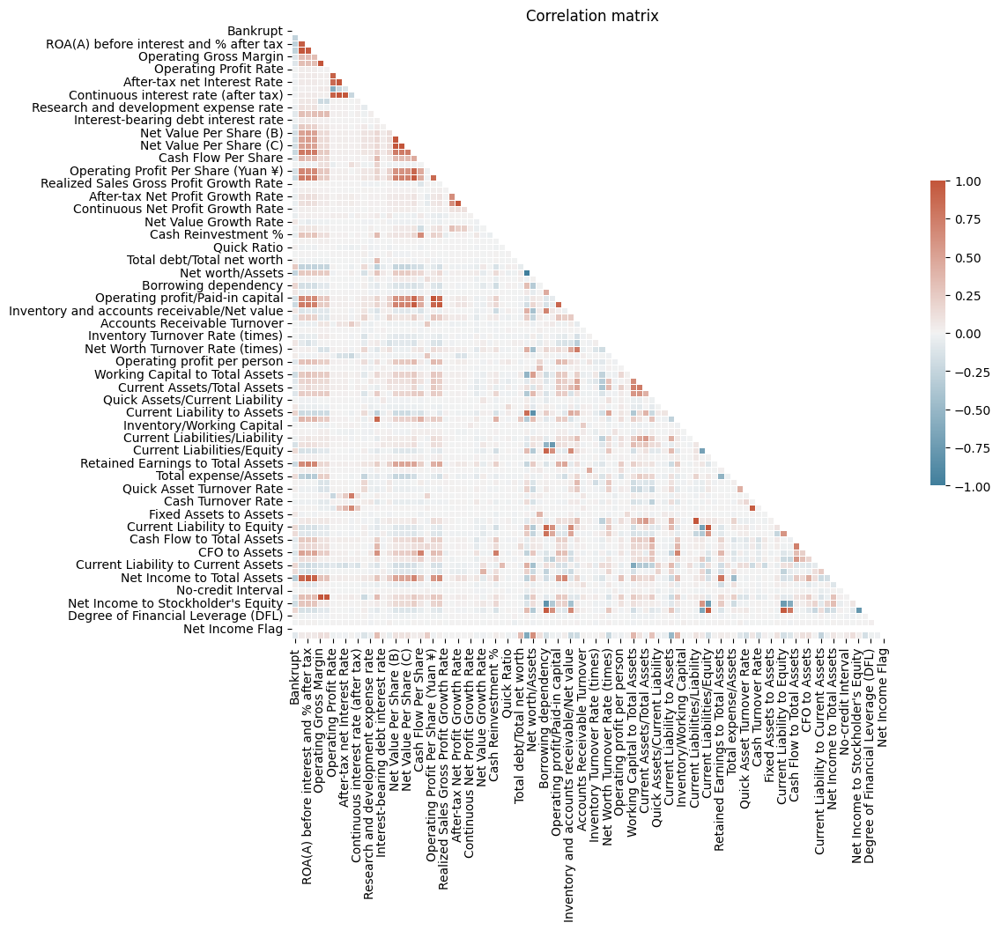

In [ ]:
# Correlation

# Compute the correlation matrix
corr = company_df.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, center=0,
            linewidths=.5, cbar_kws={"shrink": .5})

plt.title("Correlation matrix")
plt.show()

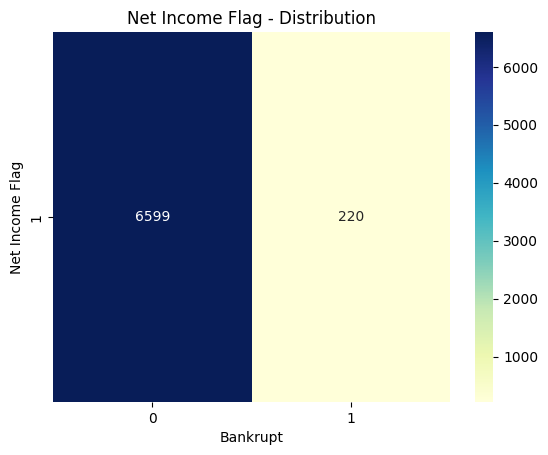

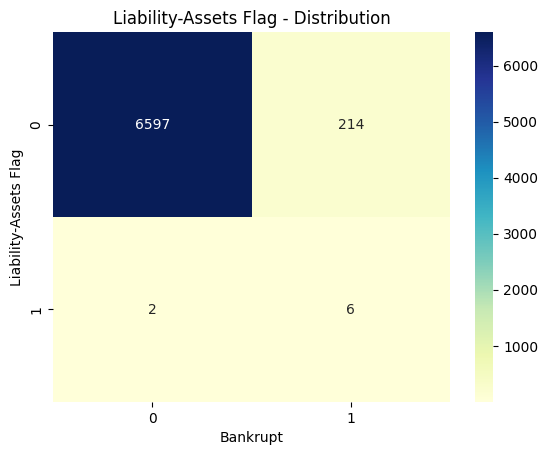

In [ ]:
sns.heatmap(pd.crosstab(company_df['Net Income Flag'],company_df["Bankrupt"]), annot=True, cmap="YlGnBu",fmt=".0f")
plt.title("Net Income Flag - Distribution")
plt.show()

sns.heatmap(pd.crosstab(company_df['Liability-Assets Flag'],company_df["Bankrupt"]), annot=True, cmap="YlGnBu",fmt=".0f")
plt.title("Liability-Assets Flag - Distribution")
plt.show()


In [ ]:
company_df.drop(['Net Income Flag'],axis = 1,inplace=True)


In [ ]:
# Train and Test split
X = company_df.drop(['Bankrupt'],axis=1)
y = company_df.Bankrupt

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

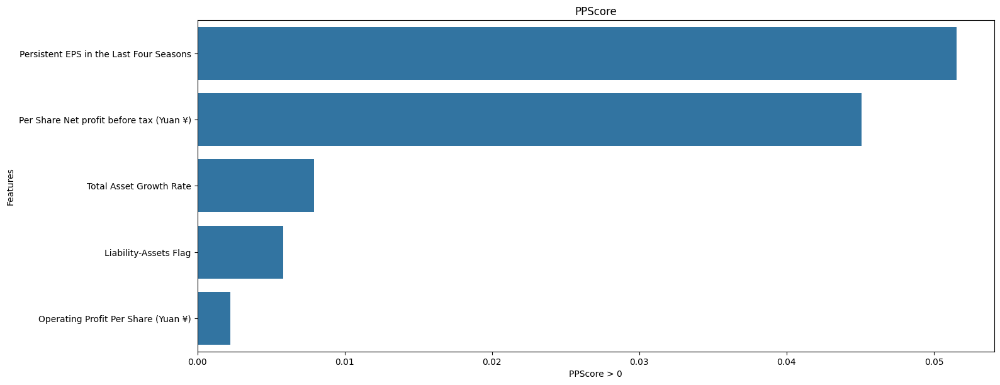

In [ ]:
# Calculating Predictive power score (PPS)
pps_input_df = X_train.copy()
pps_input_df['Bankrupt'] = y_train.astype(str).copy()
pps_df = pps.predictors(pps_input_df, y="Bankrupt")
pps_df = pps_df[pps_df.ppscore > 0]

# Plotting PPS
plt.figure(figsize=(16,6))
sns.barplot(data=pps_df, x="ppscore", y="x")
plt.ylabel("Features")
plt.xlabel("PPScore > 0")
plt.tight_layout()
plt.title("PPScore")
plt.show()

In [ ]:
pps_df.sort_values(by=['ppscore'], ascending=False)[:10]


,x,y,ppscore,case,is_valid_score,metric,baseline_score,model_score,model
0,Persistent EPS in the Last Four Seasons,Bankrupt,0.051527,classification,True,weighted F1,0.952557,0.955002,DecisionTreeClassifier()
1,Per Share Net profit before tax (Yuan ¥),Bankrupt,0.045079,classification,True,weighted F1,0.952557,0.954696,DecisionTreeClassifier()
2,Total Asset Growth Rate,Bankrupt,0.007931,classification,True,weighted F1,0.952557,0.952933,DecisionTreeClassifier()
3,Liability-Assets Flag,Bankrupt,0.005847,classification,True,weighted F1,0.952557,0.952834,DecisionTreeClassifier()
4,Operating Profit Per Share (Yuan ¥),Bankrupt,0.002257,classification,True,weighted F1,0.952557,0.952664,DecisionTreeClassifier()


In [ ]:
selected_features_final = pps_df.x.tolist()


In [ ]:
top_n_req = 10


In [ ]:
param_dist = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [5, 10, 15, 20, 25, 30,35 ,40],
    'min_samples_split': [2, 5, 10],
    'max_features': ['sqrt', 'log2']
}

# Use RandomizedSearchCV for hyperparameter tuning with 5-fold cross-validation for decision tree classifier with F1 score
dt_for_feature_selection = DecisionTreeClassifier(random_state=42)
random_search = RandomizedSearchCV(estimator=dt_for_feature_selection, param_distributions=param_dist, random_state=42, scoring = 'f1')
random_search.fit(X_train, y_train)

# Pring best params
print("Best parameters based on Random search :")
print(random_search.best_params_)

# Pring best score from CV
print("\nBest parameters based on Random search :")
print("F1 Score : ",round(random_search.best_score_,2))

Best parameters based on Random search :
{'min_samples_split': 5, 'max_features': 'log2', 'max_depth': 40, 'criterion': 'entropy'}

Best parameters based on Random search :
F1 Score :  0.33


<ipython-input-24-2a182d7c9827>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=feature_importance_df, palette='viridis')


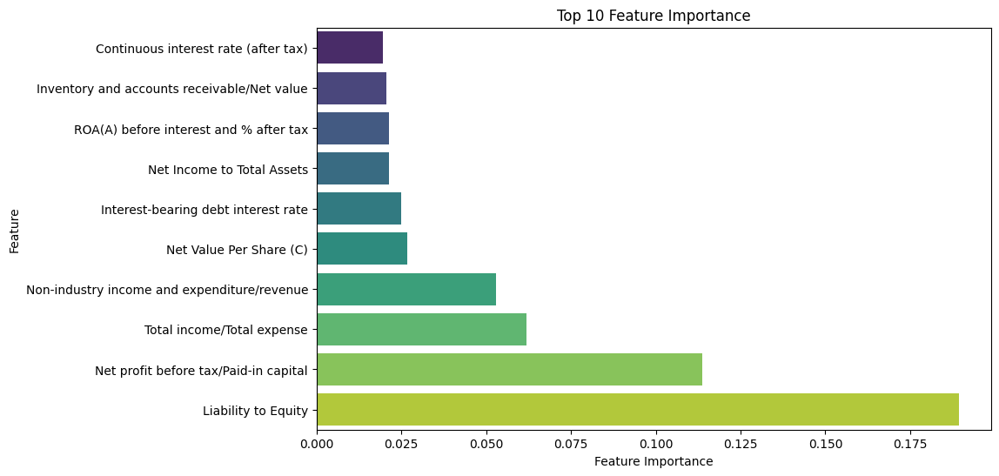

In [ ]:
# Get best decision tree model
best_dt_classifier = random_search.best_estimator_

# Extract feature importances from the trained decision tree classifier
feature_importances = best_dt_classifier.feature_importances_
feature_names = best_dt_classifier.feature_names_in_

# Get the indices of the top n features
top_n_indices = np.argsort(feature_importances)[-top_n_req:]

# Create a DataFrame for easier plotting with seaborn
feature_importance_df = pd.DataFrame({'Feature': [feature_names[i] for i in top_n_indices],
                                      'Importance': feature_importances[top_n_indices]})

# Plot the top 10 features using seaborn
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df, palette='viridis')
plt.xlabel("Feature Importance")
plt.title("Top "+str(top_n_req)+" Feature Importance")
plt.show()

In [ ]:
# Selecting above features for EDA and model building
selected_features_final = list(set(selected_features_final + feature_importance_df.Feature.to_list()))
selected_features_final.sort()

In [ ]:
print("Selected features :")
print(selected_features_final)
print("\nNumber of features selected :")
print(len((selected_features_final)))

Selected features :
['Continuous interest rate (after tax)', 'Interest-bearing debt interest rate', 'Inventory and accounts receivable/Net value', 'Liability to Equity', 'Liability-Assets Flag', 'Net Income to Total Assets', 'Net Value Per Share (C)', 'Net profit before tax/Paid-in capital', 'Non-industry income and expenditure/revenue', 'Operating Profit Per Share (Yuan ¥)', 'Per Share Net profit before tax (Yuan ¥)', 'Persistent EPS in the Last Four Seasons', 'ROA(A) before interest and % after tax', 'Total Asset Growth Rate', 'Total income/Total expense']

Number of features selected :
15


In [ ]:
del(X_train, X_test, y_train, y_test)


In [ ]:
company_df[selected_features_final].describe()


,Continuous interest rate (after tax),Interest-bearing debt interest rate,Inventory and accounts receivable/Net value,Liability to Equity,Liability-Assets Flag,Net Income to Total Assets,Net Value Per Share (C),Net profit before tax/Paid-in capital,Non-industry income and expenditure/revenue,Operating Profit Per Share (Yuan ¥),Per Share Net profit before tax (Yuan ¥),Persistent EPS in the Last Four Seasons,ROA(A) before interest and % after tax,Total Asset Growth Rate,Total income/Total expense
count,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000
mean,0.781381,1.644801e+07,0.402459,0.280365,0.001173,0.807760,0.190672,0.182715,0.303623,0.109091,0.184361,0.228813,0.558625,5.508097e+09,0.002549
std,0.012679,1.082750e+08,0.013324,0.014463,0.034234,0.040332,0.033480,0.030785,0.011163,0.027942,0.033180,0.033263,0.065620,2.897718e+09,0.012093
min,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000
25%,0.781567,2.030203e-04,0.397403,0.276944,0.000000,0.796750,0.173676,0.169376,0.303466,0.096083,0.170370,0.214711,0.535543,4.860000e+09,0.002236
50%,0.781635,3.210321e-04,0.400131,0.278778,0.000000,0.810619,0.184400,0.178456,0.303525,0.104226,0.179709,0.224544,0.559802,6.400000e+09,0.002336
75%,0.781735,5.325533e-04,0.404551,0.281449,0.000000,0.826455,0.199612,0.191607,0.303585,0.116155,0.193493,0.238820,0.589157,7.390000e+09,0.002492
max,1.000000,9.900000e+08,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,9.990000e+09,1.000000


In [ ]:
  number_inf = pd.DataFrame(company_df[(company_df == np.inf) | (company_df == np.nan)].count())

number_inf.columns = ["Count"]
number_inf['Features'] = number_inf.index

number_inf.reset_index(drop = True,inplace = True)
number_inf[["Features", "Count"]]
number_inf = number_inf[number_inf.Count > 0]
if len(number_inf) == 0 :
    print("Inf and NAN is not present")
else:
    print(number_inf)

Inf and NAN is not present


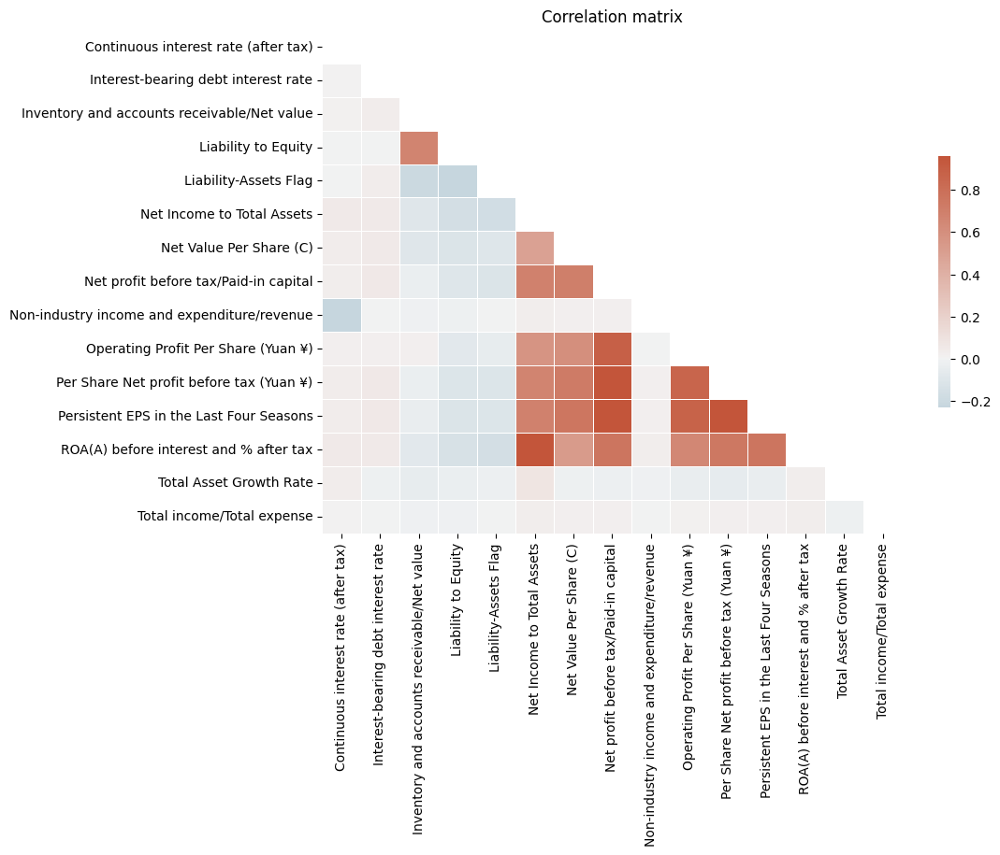

In [ ]:
# Correlation

# Compute the correlation matrix
corr = company_df[selected_features_final].corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(10, 7))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, center=0,
            linewidths=.5, cbar_kws={"shrink": .5})

plt.title("Correlation matrix")
plt.show()

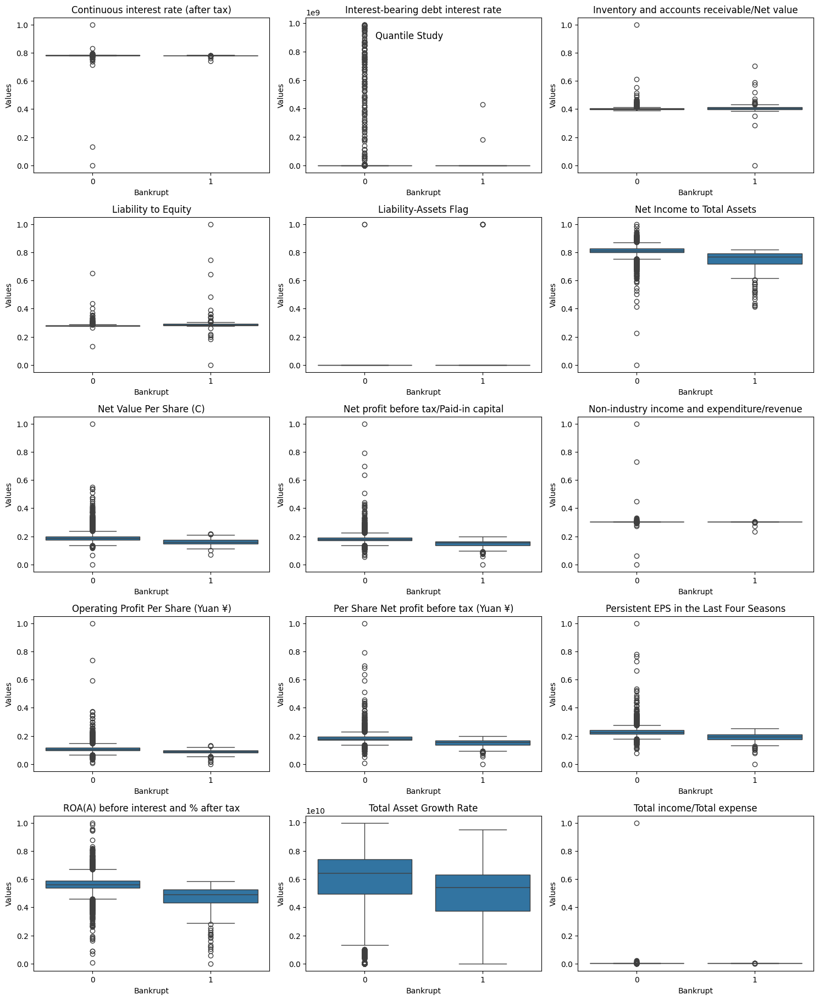

In [ ]:
features_to_plot = selected_features_final.copy()
features_to_plot

# Create a new figure
fig = plt.figure(figsize=(15, 25))

# Iterate through each column in the given list
for i, col in enumerate(features_to_plot, start=1):
    plt.subplot(7,3, i)

    # Plot the boxplot for the current column using Seaborn
    sns.boxplot(data = company_df ,y=col, x= "Bankrupt" ,orient='v')

    # Set labels and title
    plt.title(col)
    plt.ylabel('Values')
    plt.xlabel('Bankrupt')

plt.tight_layout()
fig.subplots_adjust(top=0.99)
fig.suptitle("Quantile Study")
plt.show()

In [ ]:
# Define categories of features
categories = {
    'Financial Performance Metrics': [
        'Persistent EPS in the Last Four Seasons',
        'Per Share Net profit before tax (Yuan ¥)',
        'Operating Profit Per Share (Yuan ¥)',
        'ROA(A) before interest and % after tax',
        'Net profit before tax/Paid-in capital',
        'Net Value Per Share (C)',
        'Continuous interest rate (after tax)',
        'Continuous Net Profit Growth Rate',
        'Total Asset Growth Rate',
        'Net Value Growth Rate'
    ],
    'Financial Health and Risk Indicators': [
        'Inventory and accounts receivable/Net value',
        'Liability-Assets Flag',
        'Liability to Equity',
        'Interest-bearing debt interest rate',
        'Net Income to Total Assets'
    ],
    'Income and Expense Analysis': [
        'Non-industry income and expenditure/revenue',
        'Total income/Total expense'
    ]
}

<ipython-input-33-fe8b29834832>:7: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title='Bankrupt')


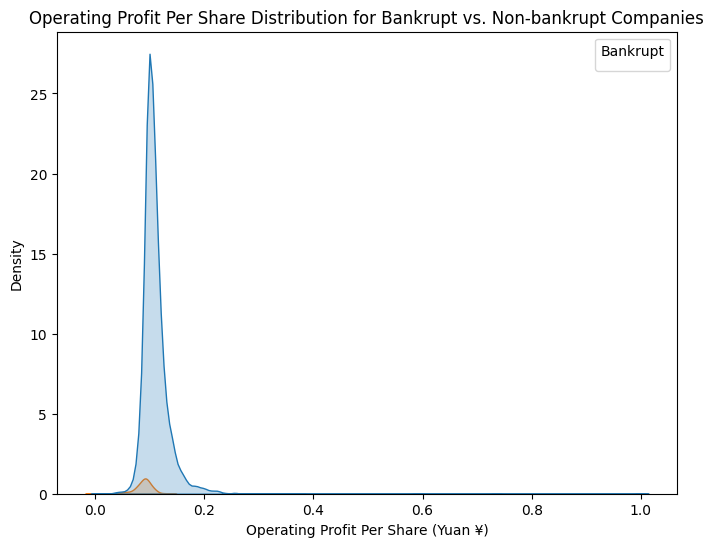

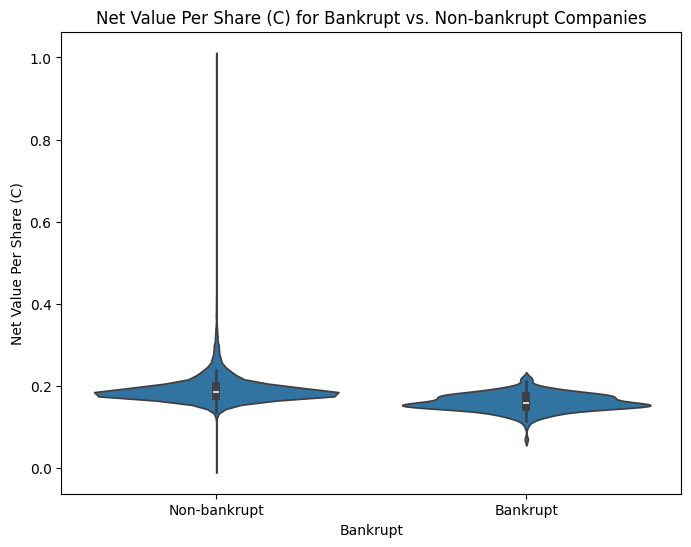

<ipython-input-33-fe8b29834832>:25: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title='Bankrupt')


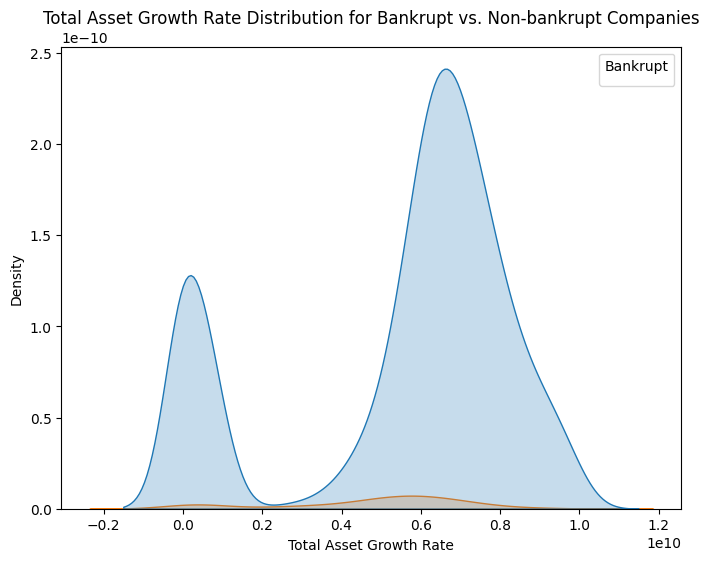

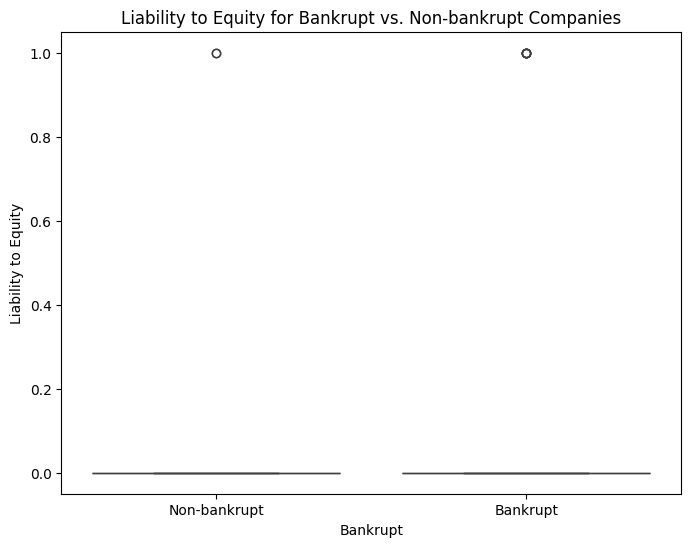

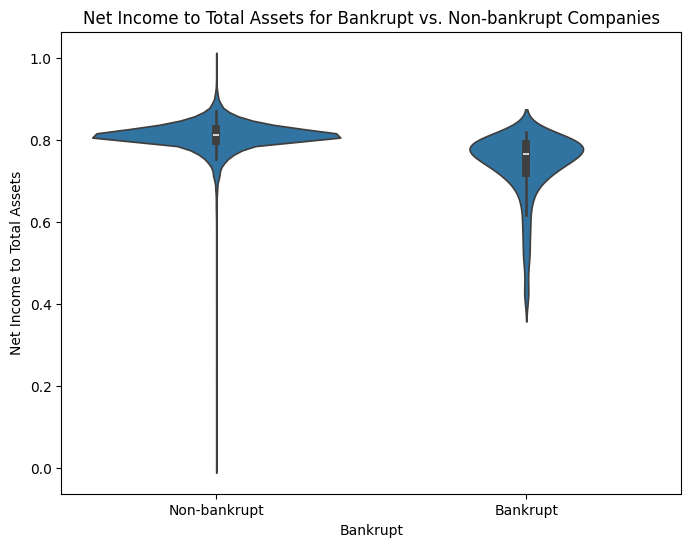

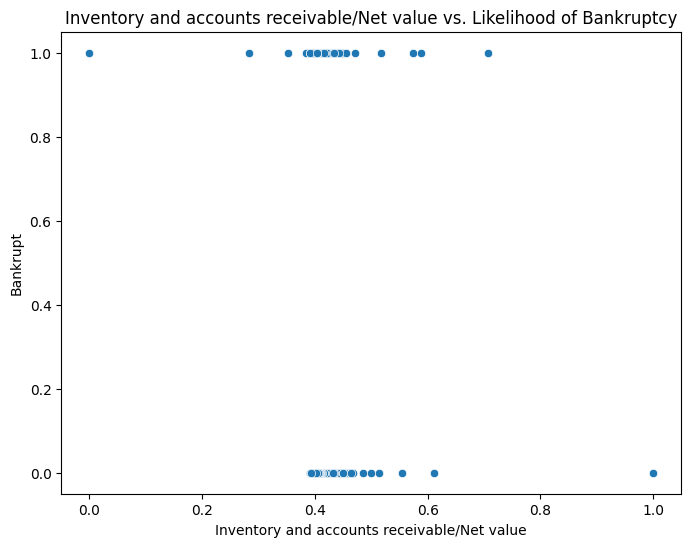

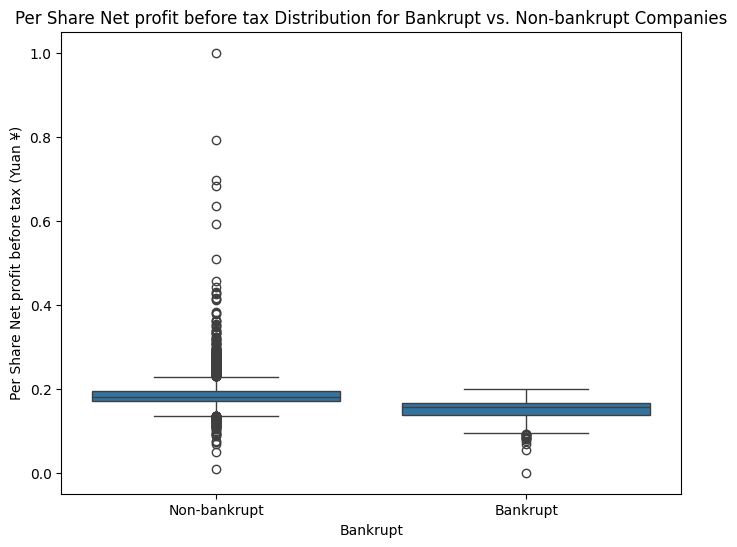

<ipython-input-33-fe8b29834832>:75: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title='Bankrupt')


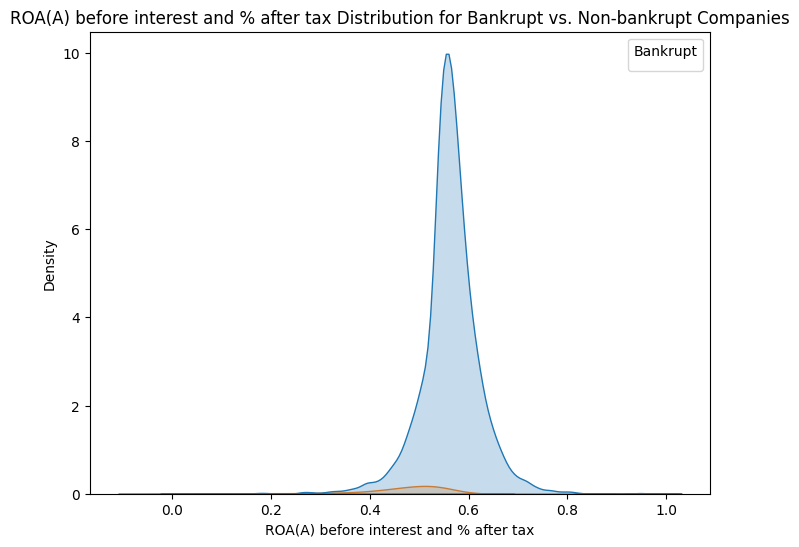

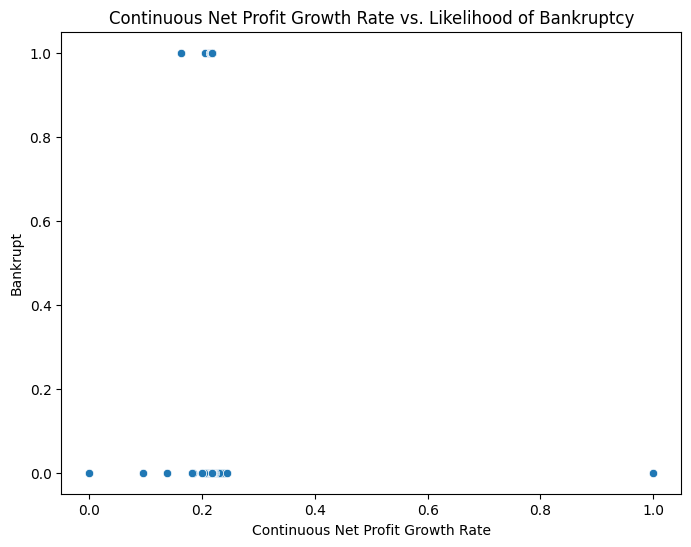

In [ ]:
# Question 1: Distribution of "Operating Profit Per Share (Yuan ¥)" for bankrupt vs. non-bankrupt companies
plt.figure(figsize=(8, 6))
sns.kdeplot(data=company_df, x='Operating Profit Per Share (Yuan ¥)', hue='Bankrupt', fill=True)
plt.title('Operating Profit Per Share Distribution for Bankrupt vs. Non-bankrupt Companies')
plt.xlabel('Operating Profit Per Share (Yuan ¥)')
plt.ylabel('Density')
plt.legend(title='Bankrupt')
plt.show()

# Question 2: Difference in "Net Value Per Share (C)" between bankrupt and non-bankrupt companies
plt.figure(figsize=(8, 6))
sns.violinplot(x='Bankrupt', y='Net Value Per Share (C)', data=company_df)
plt.title('Net Value Per Share (C) for Bankrupt vs. Non-bankrupt Companies')
plt.xlabel('Bankrupt')
plt.ylabel('Net Value Per Share (C)')
plt.xticks([0, 1], ['Non-bankrupt', 'Bankrupt'])
plt.show()

# Question 3: Distributions of "Total Asset Growth Rate" for bankrupt vs. non-bankrupt companies
plt.figure(figsize=(8, 6))
sns.kdeplot(data=company_df, x='Total Asset Growth Rate', hue='Bankrupt', fill=True)
plt.title('Total Asset Growth Rate Distribution for Bankrupt vs. Non-bankrupt Companies')
plt.xlabel('Total Asset Growth Rate')
plt.ylabel('Density')
plt.legend(title='Bankrupt')
plt.show()

# Question 4: Joint distribution of "Operating Profit Per Share" and "Per Share Net profit before tax" for bankrupt vs. non-bankrupt companies
# plt.figure(figsize=(12, 12))
# sns.pairplot(company_df, hue='Bankrupt', vars=['Operating Profit Per Share (Yuan ¥)', 'Per Share Net profit before tax (Yuan ¥)'], diag_kind='kde')
# plt.suptitle('Joint Distribution of Features by Bankruptcy')
# plt.show()

# Question 5: Comparison of "Liability to Equity" for bankrupt vs. non-bankrupt companies
plt.figure(figsize=(8, 6))
sns.boxplot(x='Bankrupt', y='Liability-Assets Flag', data=company_df)
plt.title('Liability to Equity for Bankrupt vs. Non-bankrupt Companies')
plt.xlabel('Bankrupt')
plt.ylabel('Liability to Equity')
plt.xticks([0, 1], ['Non-bankrupt', 'Bankrupt'])
plt.show()

# Question 6: Distribution of "Net Income to Total Assets" for bankrupt vs. non-bankrupt companies
plt.figure(figsize=(8, 6))
sns.violinplot(x='Bankrupt', y='Net Income to Total Assets', data=company_df)
plt.title('Net Income to Total Assets for Bankrupt vs. Non-bankrupt Companies')
plt.xlabel('Bankrupt')
plt.ylabel('Net Income to Total Assets')
plt.xticks([0, 1], ['Non-bankrupt', 'Bankrupt'])
plt.show()

# Question 7: Relationship between "Inventory and accounts receivable/Net value" and likelihood of bankruptcy
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Inventory and accounts receivable/Net value', y='Bankrupt', data=company_df)
plt.title('Inventory and accounts receivable/Net value vs. Likelihood of Bankruptcy')
plt.xlabel('Inventory and accounts receivable/Net value')
plt.ylabel('Bankrupt')
plt.show()

# Question 8: Distribution of "Per Share Net profit before tax" between bankrupt and non-bankrupt companies
plt.figure(figsize=(8, 6))
sns.boxplot(x='Bankrupt', y='Per Share Net profit before tax (Yuan ¥)', data=company_df)
plt.title('Per Share Net profit before tax Distribution for Bankrupt vs. Non-bankrupt Companies')
plt.xlabel('Bankrupt')
plt.ylabel('Per Share Net profit before tax (Yuan ¥)')
plt.xticks([0, 1], ['Non-bankrupt', 'Bankrupt'])
plt.show()

# Question 9: Distribution of "ROA(A) before interest and % after tax" between bankrupt and non-bankrupt companies
plt.figure(figsize=(8, 6))
sns.kdeplot(data=company_df, x='ROA(A) before interest and % after tax', hue='Bankrupt', fill=True)
plt.title('ROA(A) before interest and % after tax Distribution for Bankrupt vs. Non-bankrupt Companies')
plt.xlabel('ROA(A) before interest and % after tax')
plt.ylabel('Density')
plt.legend(title='Bankrupt')
plt.show()

# Question 10: Relationship between "Continuous Net Profit Growth Rate" and likelihood of bankruptcy
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Continuous Net Profit Growth Rate', y='Bankrupt', data=company_df)
plt.title('Continuous Net Profit Growth Rate vs. Likelihood of Bankruptcy')
plt.xlabel('Continuous Net Profit Growth Rate')
plt.ylabel('Bankrupt')
plt.show()

In [ ]:
company_df['Bankrupt'] = company_df['Bankrupt'].astype(str)


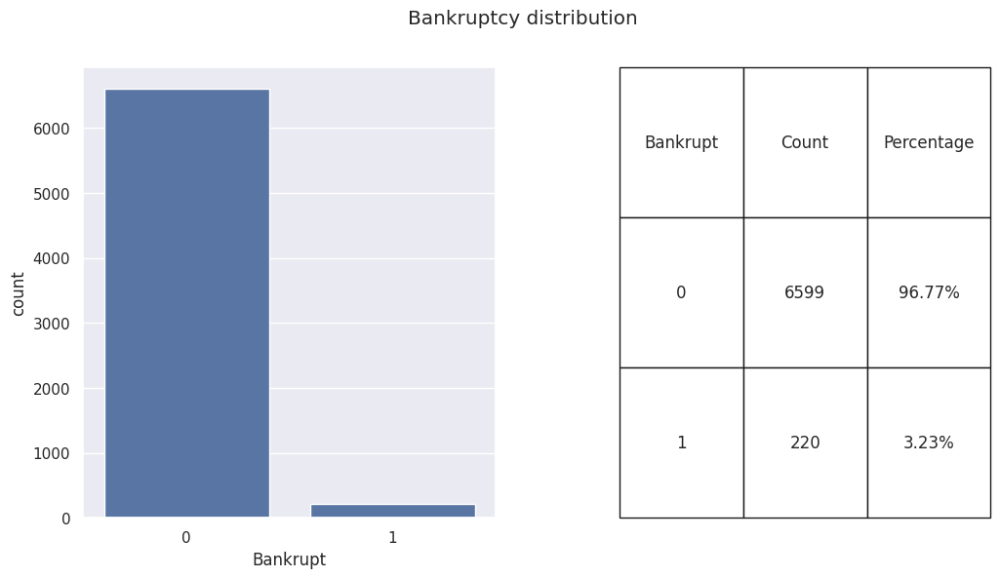

In [ ]:
# Calculate counts and percentages
count_df = company_df['Bankrupt'].value_counts().reset_index()
count_df.columns = ['Bankrupt', 'Count']
count_df['Percentage'] = (count_df['Count'] / len(company_df)) * 100
count_df['Percentage'] = round(count_df['Percentage'],2)
count_df['Percentage'] = count_df['Percentage'].astype(str) + "%"

# Create a countplot
sns.set(style="darkgrid")
plt.figure(figsize=(12, 6))

# Plot the countplot
plt.subplot(1, 2, 1)
ax = sns.countplot(x='Bankrupt', data=company_df, order = ["0","1"])

# Create a table with counts and percentages
margins = 0.1
plt.subplot(1, 2, 2)
table_ax = plt.gca()
table_ax.axis('off')  # Turn off axis for the table
table_ax.table(cellText=count_df.values,
               colLabels=count_df.columns,
               cellLoc='center',
               loc='center',
              bbox=[margins, 0, 1 - 1 * margins, 1])

plt.suptitle('Bankruptcy distribution')
plt.show()

In [ ]:
# Separate features and target variable
X = company_df[selected_features_final].copy()
y = company_df['Bankrupt'].copy()

# Perform stratified train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30,shuffle=True, stratify=y, random_state=42)

print("Target variable distribution in Train samples :")
pd.DataFrame(y_train.value_counts())

Target variable distribution in Train samples :


,Bankrupt
0,4619
1,154


In [ ]:
scaler_obj = RobustScaler()
scaler_obj.fit(X_train)
X_train = scaler_obj.transform(X_train)

In [ ]:
dt_classifier = DecisionTreeClassifier(random_state=42)
dt_classifier.fit(X_train, y_train)
y_pred = dt_classifier.predict(scaler_obj.transform(X_test))

print("Performance of Decision tree with the original data (Without Synthetic train samples)")
baseline_perf = pd.DataFrame.from_dict([perf_metrics(np.array(y_test.astype(int)),np.array(y_pred.astype(int)))])
baseline_perf

Performance of Decision tree with the original data (Without Synthetic train samples)


,accuracy,balanced_accuracy,precision,recall,f1_score
0,95.65,61.14,29.09,24.24,26.45


In [ ]:
# Sampling ratio = Number of samples in minority class after resampling / Number of samples in majority class
sampling_ratios = np.arange(0.05, 0.5 ,0.05)
dt_classifier = DecisionTreeClassifier(random_state=42)
perf_os_algo = pd.DataFrame(columns=['sampling_ratio', 'algorithm', 'accuracy', 'balanced_accuracy','precision','recall','f1_score'])

for ratio in sampling_ratios :

    # Creating Oversamplers
    RANDOMOS_obj = RandomOverSampler(sampling_strategy=ratio, random_state = 42)
    SMOTE_obj = SMOTE(sampling_strategy=ratio, random_state = 42)
    ADASYN_obj = ADASYN(sampling_strategy=ratio,random_state = 42)
    SMOTEENN_obj = SMOTEENN(sampling_strategy=ratio,random_state = 42)
    SMOTETomek_obj = SMOTETomek(sampling_strategy=ratio, random_state = 42)
    BORDERSMOTE_obj = BorderlineSMOTE(sampling_strategy=ratio,random_state = 42)

    # Oversampled train samples
    X_train_os1, y_train_os1 = oversample_data(RANDOMOS_obj,X_train,y_train)
    X_train_os2, y_train_os2 = oversample_data(SMOTE_obj,X_train,y_train)
    X_train_os3, y_train_os3 = oversample_data(ADASYN_obj,X_train,y_train)
    X_train_os4, y_train_os4 = oversample_data(SMOTEENN_obj,X_train,y_train)
    X_train_os5, y_train_os5 = oversample_data(SMOTETomek_obj,X_train,y_train)
    X_train_os6, y_train_os6 = oversample_data(BORDERSMOTE_obj,X_train,y_train)

    # Preparing train samples for testing the performance
    X_train_oversampled_list = [X_train_os1,X_train_os2,X_train_os3,X_train_os4,X_train_os5,X_train_os6]
    y_train_oversampled_list = [y_train_os1,y_train_os2,y_train_os3,y_train_os4,y_train_os5,y_train_os6]
    oversampling_algo_list = ["Random oversampling" ,"SMOTE", "ADASYN", "SMOTEENN","SMOTE Tomek","Borderline SMOTE"]

    for X_tr_set, y_tr_set, algo in zip(X_train_oversampled_list, y_train_oversampled_list,oversampling_algo_list):

        # Fitting decision tree classifer on SMOTED train data
        dt_classifier.fit(X_tr_set, y_tr_set)

        # Predicting
        y_pred = dt_classifier.predict(scaler_obj.transform(X_test))

        # Saving performance metrics to a dataframe
        perf_of_algo = perf_metrics(np.array(y_test.astype(int)),np.array(y_pred.astype(int)))
        perf_of_algo['sampling_ratio'] = ratio
        perf_of_algo['algorithm'] = algo

        perf_os_algo = pd.concat([perf_os_algo, pd.DataFrame([perf_of_algo])], ignore_index=True)

In [ ]:
print("Baseline model results : ")
display(baseline_perf)

Baseline model results : 


,accuracy,balanced_accuracy,precision,recall,f1_score
0,95.65,61.14,29.09,24.24,26.45


In [ ]:
  print("Top SMOTED model results by precision : ")
display(perf_os_algo.sort_values(by=['precision'], ascending=False).head(5))
print("Top SMOTED model results by recall : ")
display(perf_os_algo.sort_values(by=['recall'], ascending=False).head(5))
print("Top SMOTED model results by f1 score : ")
display(perf_os_algo.sort_values(by=['f1_score','recall','precision'], ascending=False).head(5))


Top SMOTED model results by precision : 


,sampling_ratio,algorithm,accuracy,balanced_accuracy,precision,recall,f1_score
4,0.05,SMOTE Tomek,96.24,68.76,41.27,39.39,40.31
29,0.25,Borderline SMOTE,95.80,75.13,38.89,53.03,44.87
24,0.25,Random oversampling,95.80,67.07,35.29,36.36,35.82
18,0.20,Random oversampling,95.80,66.34,34.85,34.85,34.85
11,0.10,Borderline SMOTE,95.41,71.99,34.44,46.97,39.74


Top SMOTED model results by recall : 


,sampling_ratio,algorithm,accuracy,balanced_accuracy,precision,recall,f1_score
45,0.40,SMOTEENN,92.03,84.17,25.38,75.76,38.02
33,0.30,SMOTEENN,92.62,82.27,26.26,71.21,38.37
51,0.45,SMOTEENN,92.42,80.71,25.14,68.18,36.73
39,0.35,SMOTEENN,93.16,79.62,26.88,65.15,38.05
27,0.25,SMOTEENN,93.30,78.23,26.80,62.12,37.44


Top SMOTED model results by f1 score : 


,sampling_ratio,algorithm,accuracy,balanced_accuracy,precision,recall,f1_score
29,0.25,Borderline SMOTE,95.80,75.13,38.89,53.03,44.87
9,0.10,SMOTEENN,94.97,76.16,33.33,56.06,41.81
4,0.05,SMOTE Tomek,96.24,68.76,41.27,39.39,40.31
11,0.10,Borderline SMOTE,95.41,71.99,34.44,46.97,39.74
53,0.45,Borderline SMOTE,95.31,71.94,33.70,46.97,39.24


In [ ]:
sampling_ratio_final = 0.4
oversampler_obj_final = SMOTEENN(sampling_strategy=sampling_ratio_final,random_state = 42)
X_train_os, y_train_os = oversample_data(oversampler_obj_final,X_train,y_train)

# Oversampled train dataframe
train_os_df = pd.DataFrame(X_train_os,columns = selected_features_final)
train_os_df['Bankrupt'] = y_train_os

del(X_train_os,y_train_os)

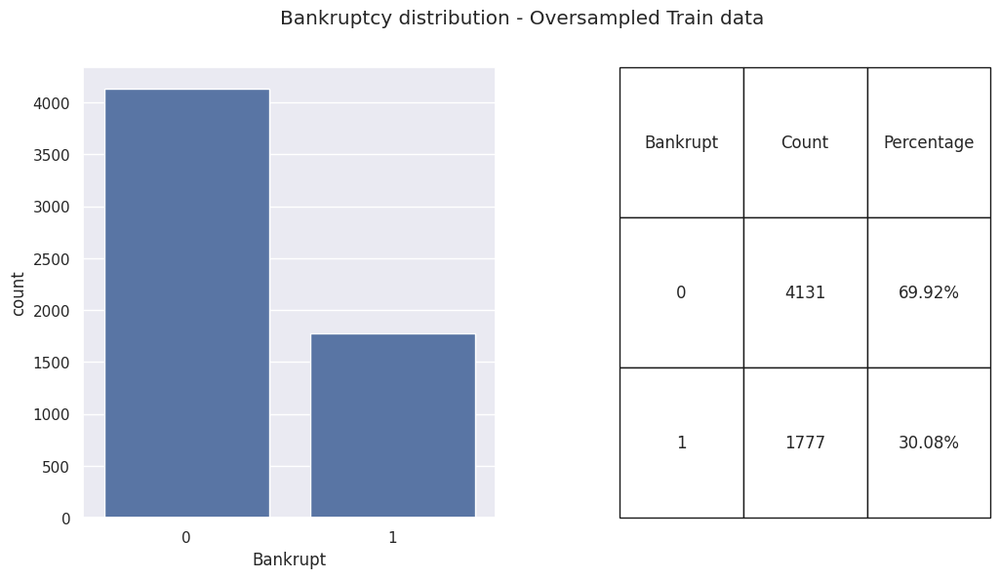

In [ ]:
# Calculate counts and percentages
count_df = train_os_df['Bankrupt'].value_counts().reset_index()
count_df.columns = ['Bankrupt', 'Count']
count_df['Percentage'] = (count_df['Count'] / len(train_os_df)) * 100
count_df['Percentage'] = round(count_df['Percentage'],2)
count_df['Percentage'] = count_df['Percentage'].astype(str) + "%"

# Create a countplot
sns.set(style="darkgrid")
plt.figure(figsize=(12, 6))

# Plot the countplot
plt.subplot(1, 2, 1)
ax = sns.countplot(x='Bankrupt', data=train_os_df, order = ["0","1"])

# Create a table with counts and percentages
margins = 0.1
plt.subplot(1, 2, 2)
table_ax = plt.gca()
table_ax.axis('off')  # Turn off axis for the table
table_ax.table(cellText=count_df.values,
               colLabels=count_df.columns,
               cellLoc='center',
               loc='center',
              bbox=[margins, 0, 1 - 1 * margins, 1])

plt.suptitle('Bankruptcy distribution - Oversampled Train data')
plt.show()

In [ ]:
# Creating contamination list
contamination_list = np.arange(0.05, min(sampling_ratio_final,0.49)+0.01, 0.005)

contamination_study_df = pd.DataFrame()

for contamination_perc in contamination_list :

    ecod_obj = ECOD(contamination = contamination_perc)

    ecod_obj.fit(train_os_df[selected_features_final])
    outliers_1 = ecod_obj.predict(train_os_df[selected_features_final])

    # Create a DataFrame using the lists
    outlier_bankruptcy_df = pd.DataFrame({'Outliers': outliers_1, 'Bankrupt': train_os_df.Bankrupt})

    # Outlier PPS
    pps_df = pps.predictors(outlier_bankruptcy_df, y="Bankrupt")
    pps_df['contamination'] = contamination_perc
    contamination_study_df = pd.concat([contamination_study_df, pps_df], ignore_index=True)

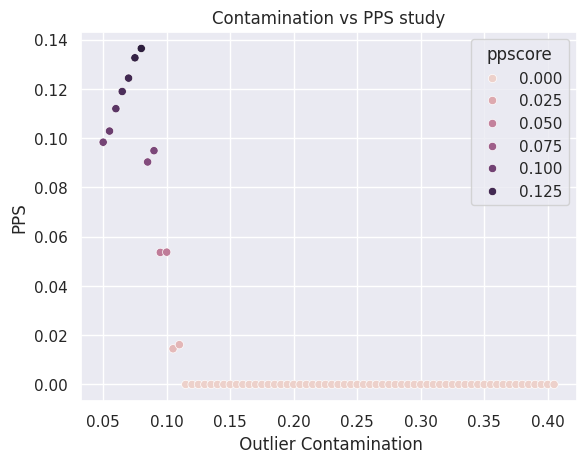

In [ ]:
sns.scatterplot(data=contamination_study_df, x='contamination', y='ppscore',marker='o',hue='ppscore')
plt.xlabel(' Outlier Contamination')
plt.ylabel('PPS')
plt.title('Contamination vs PPS study')
plt.show()

In [ ]:
# Get the index of the row with the highest mark
max_index = contamination_study_df['ppscore'].idxmax()

# Get the student name with the highest mark
best_contamination = round(contamination_study_df.loc[max_index, 'contamination'],2)

# Creating ECOD object and creating outlier flag
ecod_obj_final = ECOD(contamination = best_contamination)
ecod_obj_final.fit(train_os_df[selected_features_final])
outliers_flag = ecod_obj_final.predict(train_os_df[selected_features_final])

# Storing in the train dataframe
train_os_df['Is_outlier'] = outliers_flag


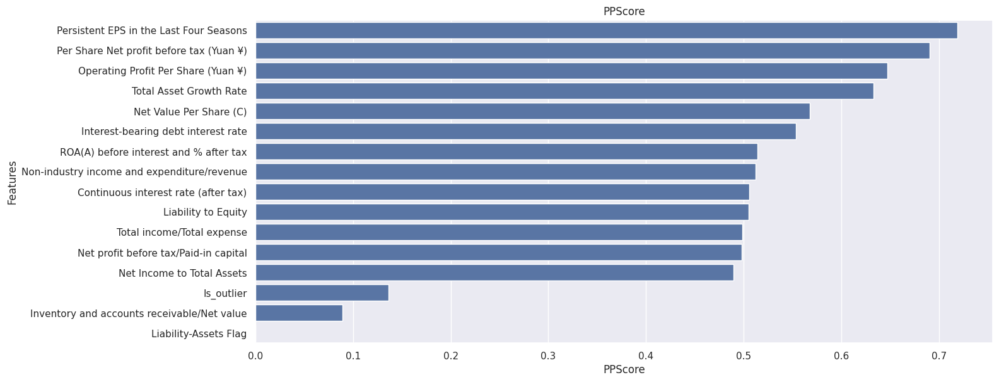

In [ ]:
# Calculating Predictive power score (PPS)
pps_df = pps.predictors(train_os_df, y="Bankrupt")

# Plotting PPS
plt.figure(figsize=(16,6))
sns.barplot(data=pps_df, x="ppscore", y="x")
plt.ylabel("Features")
plt.xlabel("PPScore")
plt.tight_layout()
plt.title("PPScore")
plt.show()

In [ ]:
top_features_pps = pps_df[pps_df.ppscore > 0].x.tolist()


In [ ]:
fig = px.scatter_3d(train_os_df, y=top_features_pps[0], z=top_features_pps[1], x=top_features_pps[2],
              color='Bankrupt', opacity=0.7)

fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()


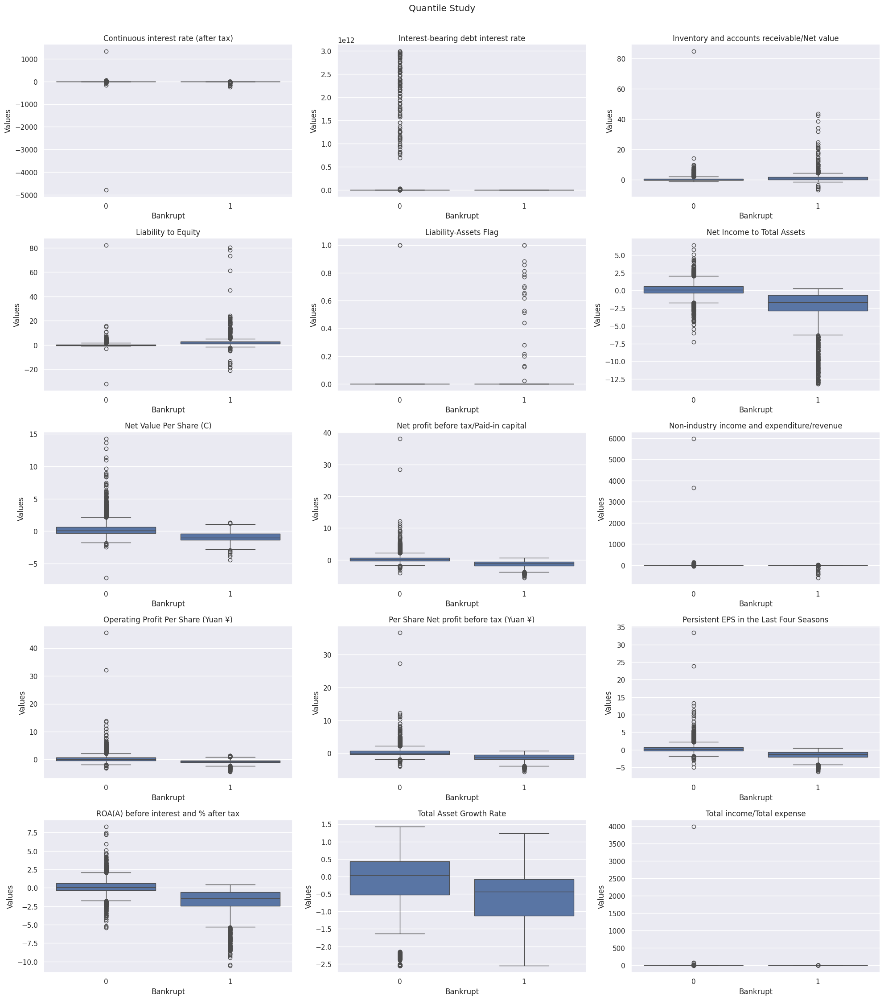

In [ ]:
# Create a new figure
fig = plt.figure(figsize=(20, 30))

# Iterate through each column in the given list
for i, col in enumerate(selected_features_final, start=1):
    plt.subplot(7,3, i)

    # Plot the boxplot for the current column using Seaborn
    sns.boxplot(data = train_os_df ,y=col, x= "Bankrupt" ,orient='v')

    # Set labels and title
    plt.title(col)
    plt.ylabel('Values')
    plt.xlabel('Bankrupt')

plt.tight_layout()
fig.subplots_adjust(top=0.99)
fig.suptitle("Quantile Study",y = 1.02)
plt.show()

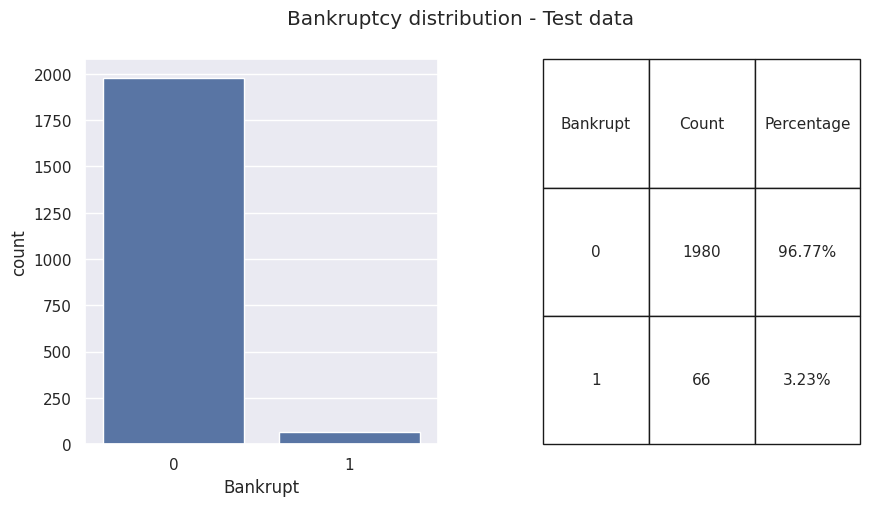

In [ ]:
# Calculate counts and percentages
count_df = y_test.value_counts().reset_index()
count_df.columns = ['Bankrupt', 'Count']
count_df['Percentage'] = (count_df['Count'] / len(y_test)) * 100
count_df['Percentage'] = round(count_df['Percentage'],2)
count_df['Percentage'] = count_df['Percentage'].astype(str) + "%"

# Create a countplot
sns.set(style="darkgrid")
plt.figure(figsize=(10, 5))

# Plot the countplot
plt.subplot(1, 2, 1)
ax = sns.countplot(x='Bankrupt', data=pd.DataFrame(y_test), order = ["0","1"])

# Create a table with counts and percentages
margins = 0.1
plt.subplot(1, 2, 2)
table_ax = plt.gca()
table_ax.axis('off')  # Turn off axis for the table
table_ax.table(cellText=count_df.values,
               colLabels=count_df.columns,
               cellLoc='center',
               loc='center',
              bbox=[margins, 0, 1 - 1 * margins, 1])

plt.suptitle('Bankruptcy distribution - Test data')
plt.show()

In [ ]:
X_test_os, y_test_os = oversample_data(oversampler_obj_final,scaler_obj.transform(X_test),y_test)

# Oversampled train dataframe
test_os_df = pd.DataFrame(X_test_os,columns = X_test.columns)
test_os_df['Bankrupt'] = y_test_os

del(X_test_os,y_test_os)

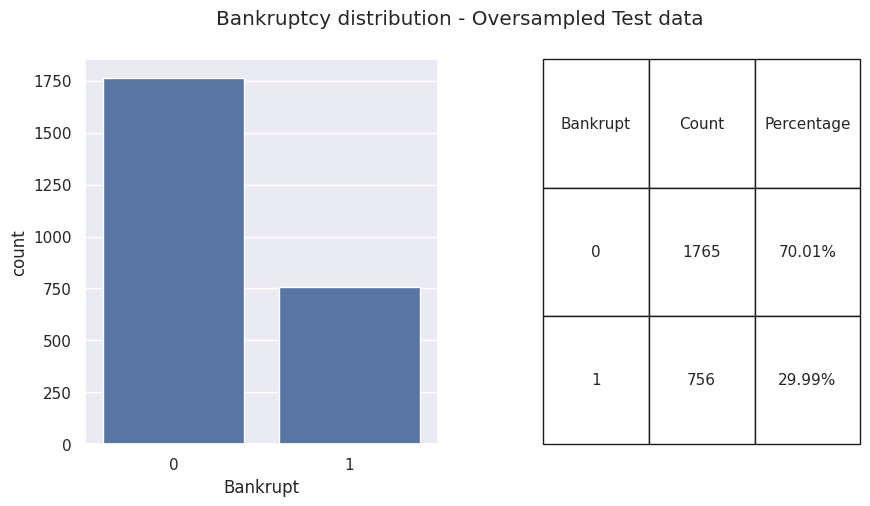

In [ ]:
# Calculate counts and percentages
count_df = test_os_df['Bankrupt'].value_counts().reset_index()
count_df.columns = ['Bankrupt', 'Count']
count_df['Percentage'] = (count_df['Count'] / len(test_os_df)) * 100
count_df['Percentage'] = round(count_df['Percentage'],2)
count_df['Percentage'] = count_df['Percentage'].astype(str) + "%"

# Create a countplot
sns.set(style="darkgrid")
plt.figure(figsize=(10, 5))

# Plot the countplot
plt.subplot(1, 2, 1)
ax = sns.countplot(x='Bankrupt', data=test_os_df, order = ["0","1"])

# Create a table with counts and percentages
margins = 0.1
plt.subplot(1, 2, 2)
table_ax = plt.gca()
table_ax.axis('off')  # Turn off axis for the table
table_ax.table(cellText=count_df.values,
               colLabels=count_df.columns,
               cellLoc='center',
               loc='center',
              bbox=[margins, 0, 1 - 1 * margins, 1])

plt.suptitle('Bankruptcy distribution - Oversampled Test data')
plt.show()

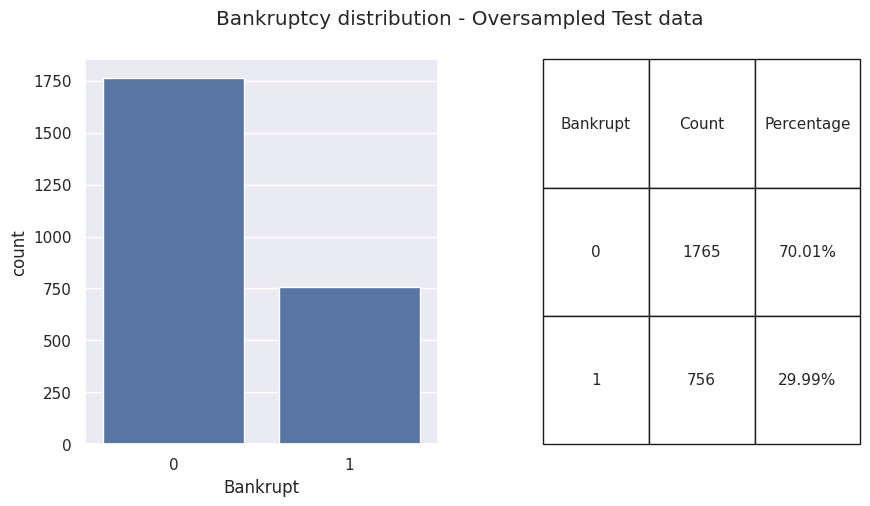

In [ ]:
# Calculate counts and percentages
count_df = test_os_df['Bankrupt'].value_counts().reset_index()
count_df.columns = ['Bankrupt', 'Count']
count_df['Percentage'] = (count_df['Count'] / len(test_os_df)) * 100
count_df['Percentage'] = round(count_df['Percentage'],2)
count_df['Percentage'] = count_df['Percentage'].astype(str) + "%"

# Create a countplot
sns.set(style="darkgrid")
plt.figure(figsize=(10, 5))

# Plot the countplot
plt.subplot(1, 2, 1)
ax = sns.countplot(x='Bankrupt', data=test_os_df, order = ["0","1"])

# Create a table with counts and percentages
margins = 0.1
plt.subplot(1, 2, 2)
table_ax = plt.gca()
table_ax.axis('off')  # Turn off axis for the table
table_ax.table(cellText=count_df.values,
               colLabels=count_df.columns,
               cellLoc='center',
               loc='center',
              bbox=[margins, 0, 1 - 1 * margins, 1])

plt.suptitle('Bankruptcy distribution - Oversampled Test data')
plt.show()

In [ ]:
print("Features used to build a model : ",selected_features_final)


Features used to build a model :  ['Continuous interest rate (after tax)', 'Interest-bearing debt interest rate', 'Inventory and accounts receivable/Net value', 'Liability to Equity', 'Liability-Assets Flag', 'Net Income to Total Assets', 'Net Value Per Share (C)', 'Net profit before tax/Paid-in capital', 'Non-industry income and expenditure/revenue', 'Operating Profit Per Share (Yuan ¥)', 'Per Share Net profit before tax (Yuan ¥)', 'Persistent EPS in the Last Four Seasons', 'ROA(A) before interest and % after tax', 'Total Asset Growth Rate', 'Total income/Total expense']


In [ ]:
X_train_os = train_os_df[selected_features_final]
y_train_os = train_os_df.Bankrupt.astype(int)


In [ ]:
X_test_final = pd.DataFrame(test_os_df[selected_features_final],columns=selected_features_final)
y_test_final = test_os_df.Bankrupt.astype(int)

In [ ]:
# Define the XGBoost classifier
xgb = XGBClassifier(random_state = 42)

# Define hyperparameters to search
params = {
    'n_estimators': [50,100,150,200],
    'max_depth': [3, 4, 5],
    'learning_rate': np.linspace(0.01, 0.2, 10),
    'subsample': np.linspace(0.6, 1.0, 5),
    'colsample_bytree': np.linspace(0.6, 1.0, 5),
    'gamma': [0, 0.1, 0.2, 0.3, 0.4],
    'min_child_weight': [1, 2, 3, 4]
}

# Perform random search
random_search = RandomizedSearchCV(estimator=xgb, param_distributions=params, n_iter=50, scoring='f1', cv=5, verbose=1, random_state=42)
random_search.fit(X_train_os, y_train_os)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate...
                   param_distributions={'colsample_bytree': array([0.6, 0.7, 0.8, 0.9, 1. ]),
                                        'gamma': [0, 0.1, 0.2, 0.3, 0.4],
                                        'learning_rate': array([0.01      , 0.03111111, 0.05222222, 0.07333333, 0.09444444,
       0.11555556, 0.13666667, 0.15777778, 0.17888889, 0.2       ]),
                                        'max_depth': [3, 4, 5],
                                        'min_child_weight': [1, 2, 3, 4],
                                        'n_estimators': [50, 100, 150, 200],
                                        'subsample': array([0.6, 0.7, 0.8, 0.9, 1. ])},
                   random_state=42, scoring='f1', verbose=1)

In [ ]:
# Print the best parameters found
print("Best score: ", round(random_search.best_score_,2))

# Print the best parameters found
print("Best parameters found: ", random_search.best_params_)

# Get the best model
ml_model = random_search.best_estimator_

Best score:  0.97
Best parameters found:  {'subsample': 0.9, 'n_estimators': 150, 'min_child_weight': 3, 'max_depth': 4, 'learning_rate': 0.2, 'gamma': 0.1, 'colsample_bytree': 0.8}


In [ ]:
# Predicting probabilities for each train sample
y_train_pred_prob = ml_model.predict_proba(X_train_os)

# Saving prediction in a dataframe
y_train_pred_prob = pd.DataFrame(y_train_pred_prob,columns=["0","1"])

# Providing threshold as 0.5
y_train_pred_prob["Prediction"] = y_train_pred_prob["1"] > 0.5
y_train_pred_prob["Prediction"] = y_train_pred_prob["Prediction"].astype(int)
y_train_pred_prob["True_Class"] = y_train_os

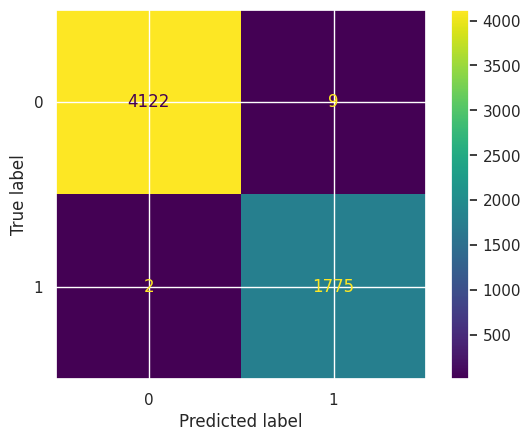

In [ ]:
cm = confusion_matrix(y_train_pred_prob.True_Class, y_train_pred_prob.Prediction)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.show()

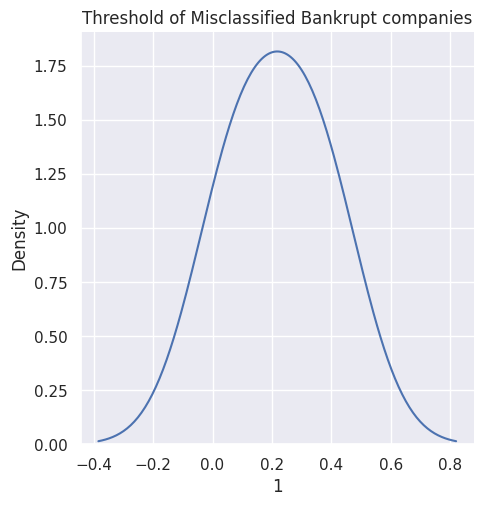

In [ ]:
sns.displot(data=y_train_pred_prob[(y_train_pred_prob.Prediction == 0) & (y_train_pred_prob.True_Class == 1)], x="1", kind="kde")
plt.title("Threshold of Misclassified Bankrupt companies")
plt.show()

In [ ]:
final_prediction_threshold = 0.5


In [ ]:
# Providing threshold as 0.5
y_train_pred_prob["Prediction"] = y_train_pred_prob["1"] > final_prediction_threshold
y_train_pred_prob["Prediction"] = y_train_pred_prob["Prediction"].astype(int)
y_train_pred_prob["True_Class"] = y_train_os

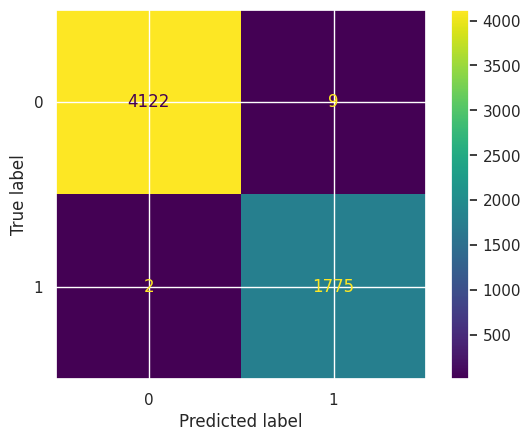

In [ ]:
cm = confusion_matrix(y_train_pred_prob.True_Class, y_train_pred_prob.Prediction)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.show()

In [ ]:
# Predict
y_pred = ml_model.predict_proba(X_test_final)
# y_pred = ml_model.predict_proba(pd.DataFrame(input_scaler_func(X_test[selected_features_final]),columns = selected_features_final))

# Saving prediction in a dataframe
y_test_pred_prob = pd.DataFrame(y_pred,columns=["0","1"])

# Providing threshold as 0.5
y_test_pred_prob["Prediction"] = y_test_pred_prob["1"] > final_prediction_threshold
y_test_pred_prob["Prediction"] = y_test_pred_prob["Prediction"].astype(int)
y_test_pred_prob["True_Class"] = y_test_final

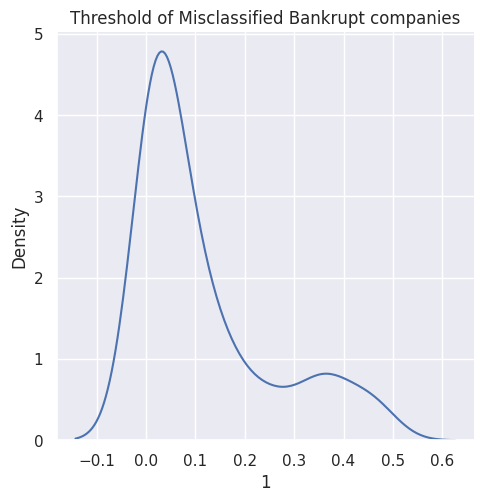

In [ ]:
sns.displot(data=y_test_pred_prob[(y_test_pred_prob.Prediction == 0) & (y_test_pred_prob.True_Class == 1)], x="1", kind="kde")
plt.title("Threshold of Misclassified Bankrupt companies")
plt.show()

In [ ]:
print(classification_report(y_true = y_test_pred_prob.True_Class, y_pred = y_test_pred_prob.Prediction))

              precision    recall  f1-score   support

           0       0.90      0.98      0.94      1765
           1       0.94      0.75      0.84       756

    accuracy                           0.91      2521
   macro avg       0.92      0.87      0.89      2521
weighted avg       0.91      0.91      0.91      2521



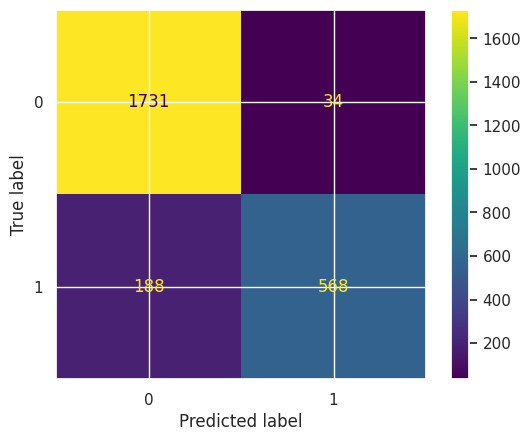

In [ ]:
cm = confusion_matrix(y_test_pred_prob.True_Class, y_test_pred_prob.Prediction)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.show()

In [ ]:
# Create a DataFrame with feature names and their corresponding importances
feature_importance_df = pd.DataFrame({'Feature': ml_model.feature_names_in_, 'Importance': ml_model.feature_importances_})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

feature_importance_df

,Feature,Importance
11,Persistent EPS in the Last Four Seasons,0.231534
0,Continuous interest rate (after tax),0.194606
3,Liability to Equity,0.138760
8,Non-industry income and expenditure/revenue,0.097503
5,Net Income to Total Assets,0.050614
7,Net profit before tax/Paid-in capital,0.048577
10,Per Share Net profit before tax (Yuan ¥),0.046849
1,Interest-bearing debt interest rate,0.040916
6,Net Value Per Share (C),0.030559
2,Inventory and accounts receivable/Net value,0.030428


In [ ]:
test_interpretation_df = pd.concat([X_test_final, y_test_pred_prob], axis=1)
test_interpretation_df = test_interpretation_df[(test_interpretation_df.Prediction == 0 ) & (test_interpretation_df.True_Class == 1)]

# Shuffle records
test_interpretation_df = test_interpretation_df.sample(frac = 1,random_state = 42)

test_interpretation_df.head()

,Continuous interest rate (after tax),Interest-bearing debt interest rate,Inventory and accounts receivable/Net value,Liability to Equity,Liability-Assets Flag,Net Income to Total Assets,Net Value Per Share (C),Net profit before tax/Paid-in capital,Non-industry income and expenditure/revenue,Operating Profit Per Share (Yuan ¥),Per Share Net profit before tax (Yuan ¥),Persistent EPS in the Last Four Seasons,ROA(A) before interest and % after tax,Total Asset Growth Rate,Total income/Total expense,0,1,Prediction,True_Class
2501,-0.997266,0.027932,-28.795862,-31.021200,0.501112,-1.699567,-0.575571,-2.355329,-1.597910,-2.323107,-2.262732,-2.531245,-1.399552,-0.238456,-1.030941,0.999511,0.000489,0,1
2420,-1.250075,0.360343,0.517242,0.679948,0.000000,-1.212412,-0.918288,-0.823025,-0.052723,-0.916273,-0.806995,-0.877708,-1.115686,-0.168452,-1.077621,0.942309,0.057691,0,1
1831,-0.144522,1.218003,-0.546779,0.254744,0.000000,-0.366876,-0.159405,-0.415920,-0.735270,-0.354419,-0.407331,-0.346144,-0.381785,0.420903,-0.073835,0.926555,0.073445,0,1
1822,-0.869416,0.296073,0.582132,0.218033,0.000000,-1.265008,-0.555738,-0.818562,-0.902692,-0.409091,-0.795302,-1.008130,-0.962012,-1.298805,-0.753328,0.560155,0.439845,0,1
2041,-0.948231,1.169003,0.309019,0.893454,0.000000,-0.985367,-0.913075,-0.716989,-0.500444,-0.655713,-0.705605,-0.767575,-0.773173,-0.380687,-0.847711,0.923554,0.076446,0,1


In [ ]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_train_os.to_numpy(),mode='classification', feature_names=X_train_os.columns, class_names=['0','1'])

In [ ]:
i = 1
exp = explainer.explain_instance(test_interpretation_df[selected_features_final].iloc[i].to_numpy(), ml_model.predict_proba, num_features=5, top_labels=1)
exp.show_in_notebook(show_table=True, show_all=True)

In [ ]:
i = 2
exp = explainer.explain_instance(test_interpretation_df[selected_features_final].iloc[i].to_numpy(), ml_model.predict_proba, num_features=5, top_labels=1)
exp.show_in_notebook(show_table=True, show_all=True)

In [ ]:
i = 3
exp = explainer.explain_instance(test_interpretation_df[selected_features_final].iloc[i].to_numpy(), ml_model.predict_proba, num_features=5, top_labels=1)
exp.show_in_notebook(show_table=True, show_all=True)

In [ ]:
i = 4
exp = explainer.explain_instance(test_interpretation_df[selected_features_final].iloc[i].to_numpy(), ml_model.predict_proba, num_features=5, top_labels=1)
exp.show_in_notebook(show_table=True, show_all=True)

In [ ]:
i = 5
exp = explainer.explain_instance(test_interpretation_df[selected_features_final].iloc[i].to_numpy(), ml_model.predict_proba, num_features=5, top_labels=1)
exp.show_in_notebook(show_table=True, show_all=True)